In [388]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import scipy.integrate as spi

import pandas as pd
# import seaborn as sns
# from sklearn.ensemble import RandomForestClassifier
from sklearn import preprocessing
import math
from sklearn.metrics import accuracy_score

from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import seaborn as sns

from sklearn.ensemble import RandomForestRegressor


# Обработка датасета

In [389]:
df = pd.read_csv('ObesityDataSet_raw_and_data_sinthetic.csv', header=0)

In [390]:
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.000000,3.000000,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.000000,3.000000,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.000000,3.000000,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.000000,3.000000,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.000000,1.000000,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
5,Male,29.000000,1.620000,53.000000,no,yes,2.000000,3.000000,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Automobile,Normal_Weight
6,Female,23.000000,1.500000,55.000000,yes,yes,3.000000,3.000000,Sometimes,no,2.000000,no,1.000000,0.000000,Sometimes,Motorbike,Normal_Weight
7,Male,22.000000,1.640000,53.000000,no,no,2.000000,3.000000,Sometimes,no,2.000000,no,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
8,Male,24.000000,1.780000,64.000000,yes,yes,3.000000,3.000000,Sometimes,no,2.000000,no,1.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
9,Male,22.000000,1.720000,68.000000,yes,yes,2.000000,3.000000,Sometimes,no,2.000000,no,1.000000,1.000000,no,Public_Transportation,Normal_Weight


In [391]:
le = preprocessing.LabelEncoder()
for column_name in ('Gender', 'family_history_with_overweight', 'FAVC', 'FCVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad'):
    df[column_name] = le.fit_transform(df[column_name])
y = df['NObeyesdad']
X = df.loc[:, df.columns != 'NObeyesdad']

In [392]:
X

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,0,21.000000,1.620000,64.000000,1,0,170,3.000000,2,0,2.000000,0,0.000000,1.000000,3,3
1,0,21.000000,1.520000,56.000000,1,0,809,3.000000,2,1,3.000000,1,3.000000,0.000000,2,3
2,1,23.000000,1.800000,77.000000,1,0,170,3.000000,2,0,2.000000,0,2.000000,1.000000,1,3
3,1,27.000000,1.800000,87.000000,0,0,809,3.000000,2,0,2.000000,0,2.000000,0.000000,1,4
4,1,22.000000,1.780000,89.800000,0,0,170,1.000000,2,0,2.000000,0,0.000000,0.000000,2,3
5,1,29.000000,1.620000,53.000000,0,1,170,3.000000,2,0,2.000000,0,0.000000,0.000000,2,0
6,0,23.000000,1.500000,55.000000,1,1,809,3.000000,2,0,2.000000,0,1.000000,0.000000,2,2
7,1,22.000000,1.640000,53.000000,0,0,170,3.000000,2,0,2.000000,0,3.000000,0.000000,2,3
8,1,24.000000,1.780000,64.000000,1,1,809,3.000000,2,0,2.000000,0,1.000000,1.000000,1,3
9,1,22.000000,1.720000,68.000000,1,1,170,3.000000,2,0,2.000000,0,1.000000,1.000000,3,3


# Очистка датасета

In [393]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   int64  
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   int64  
 5   FAVC                            2111 non-null   int64  
 6   FCVC                            2111 non-null   int64  
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   int64  
 9   SMOKE                           2111 non-null   int64  
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   int64  
 12  FAF                             21

In [394]:
df.describe()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,0.505921,24.312600,1.701677,86.586058,0.817622,0.883941,457.986736,2.685628,1.859308,0.020843,2.008011,0.045476,1.010298,0.657866,2.268593,2.365230,3.015632
std,0.500083,6.345968,0.093305,26.191172,0.386247,0.320371,295.226514,0.778039,0.468543,0.142893,0.612953,0.208395,0.850592,0.608927,0.515498,1.261423,1.952090
min,0.000000,14.000000,1.450000,39.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,19.947192,1.630000,65.473343,1.000000,1.000000,170.000000,2.658738,2.000000,0.000000,1.584812,0.000000,0.124505,0.000000,2.000000,3.000000,1.000000
50%,1.000000,22.777890,1.700499,83.000000,1.000000,1.000000,421.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,0.625350,2.000000,3.000000,3.000000
75%,1.000000,26.000000,1.768464,107.430682,1.000000,1.000000,809.000000,3.000000,2.000000,0.000000,2.477420,0.000000,1.666678,1.000000,3.000000,3.000000,5.000000
max,1.000000,61.000000,1.980000,173.000000,1.000000,1.000000,809.000000,4.000000,3.000000,1.000000,3.000000,1.000000,3.000000,2.000000,3.000000,4.000000,6.000000


In [395]:
C=len(df.columns)
L=len(df.index)
CN=df.count() #количество
NP=((L-CN)/L)*100 #процент пропущенных значений
MN=df.min() #минимум
Q1=df.quantile(q=0.25) #первый квартиль
MA=df.mean() #среднее значение
ME=df.median() #медиана
Q3=df.quantile(q=0.75) #третий квартиль
MX=df.max() #максимум
ST=df.std() #стандартное отклонение
P=df.nunique() #мощность
IQ=Q3-Q1 #интерквартильный размах

In [396]:
frame = pd.concat([CN, NP, MN, Q1, MA, ME, Q3, MX, ST, P, IQ], axis=1, join="inner")
frame=frame.T
f=pd.DataFrame(frame)
f.index=['Количество', 'Процент пропусков', 'Минимум', 'Первый квартиль','Среднее', 'Медиана', 'Третий квартиль', 'Максимум','Стандартное отклонение', 'Мощность', 'Интерквартильный размах']
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
f1=f.style.apply(lambda x: ["background-color:tomato" if i==1 else "" for i in x], axis=1, subset=(["Мощность"], slice(None))).apply(lambda x: ["background-color:tomato" if i>=60 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:steelblue" if (i<30 and i>0) else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None))).apply(lambda x: ["background-color:limegreen" if i==0 else "" for i in x], axis=1, subset=(["Процент пропусков"], slice(None)))
f1

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
Количество,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
Процент пропусков,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Минимум,0.000000,14.000000,1.450000,39.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Первый квартиль,0.000000,19.947192,1.630000,65.473343,1.000000,1.000000,170.000000,2.658738,2.000000,0.000000,1.584812,0.000000,0.124505,0.000000,2.000000,3.000000,1.000000
Среднее,0.505921,24.312600,1.701677,86.586058,0.817622,0.883941,457.986736,2.685628,1.859308,0.020843,2.008011,0.045476,1.010298,0.657866,2.268593,2.365230,3.015632
Медиана,1.000000,22.777890,1.700499,83.000000,1.000000,1.000000,421.000000,3.000000,2.000000,0.000000,2.000000,0.000000,1.000000,0.625350,2.000000,3.000000,3.000000
Третий квартиль,1.000000,26.000000,1.768464,107.430682,1.000000,1.000000,809.000000,3.000000,2.000000,0.000000,2.477420,0.000000,1.666678,1.000000,3.000000,3.000000,5.000000
Максимум,1.000000,61.000000,1.980000,173.000000,1.000000,1.000000,809.000000,4.000000,3.000000,1.000000,3.000000,1.000000,3.000000,2.000000,3.000000,4.000000,6.000000
Стандартное отклонение,0.500083,6.345968,0.093305,26.191172,0.386247,0.320371,295.226514,0.778039,0.468543,0.142893,0.612953,0.208395,0.850592,0.608927,0.515498,1.261423,1.952090
Мощность,2.000000,1402.000000,1574.000000,1525.000000,2.000000,2.000000,810.000000,635.000000,4.000000,2.000000,1268.000000,2.000000,1190.000000,1129.000000,4.000000,5.000000,7.000000


<Axes: >

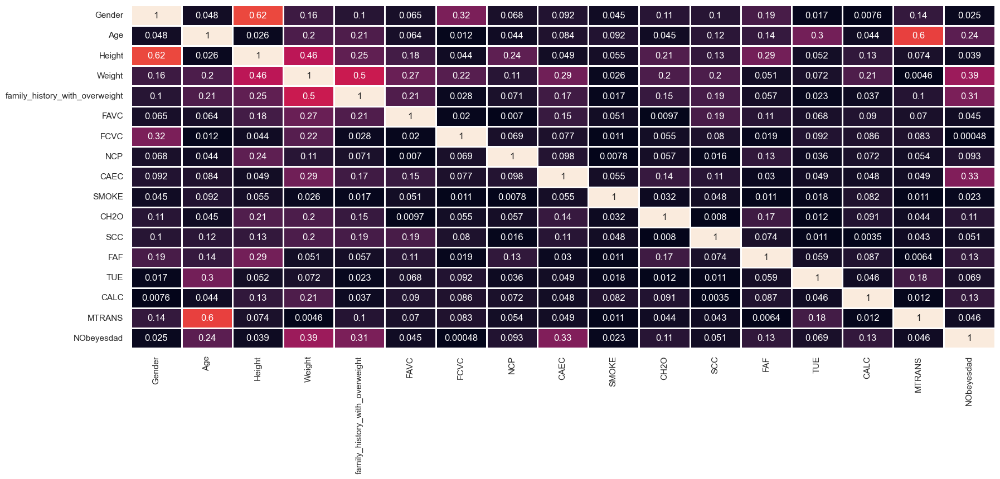

In [397]:
sns.set(rc = {'figure.figsize':(20,8)})
sns.heatmap(abs(df.corr()), annot=True, linewidths=1, cbar=False)

<Axes: >

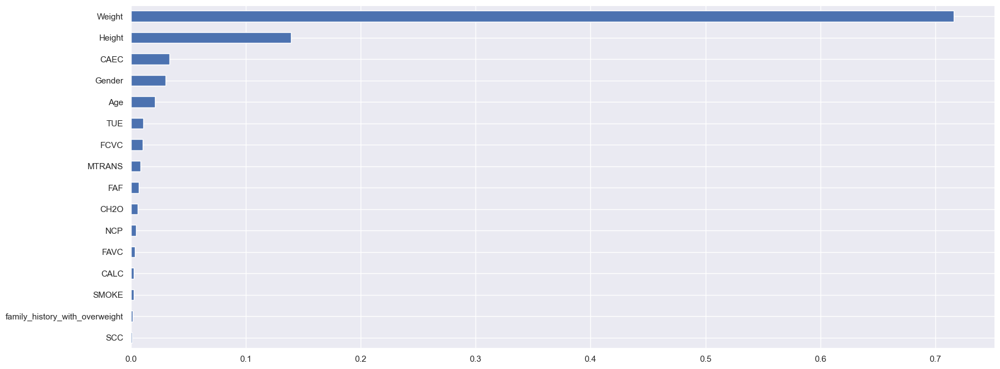

In [398]:
regr = RandomForestRegressor(max_depth=20, random_state=0)
regr.fit(X, y)

feat_importances = pd.Series(regr.feature_importances_, index=X.columns).sort_values()
feat_importances.plot(kind='barh')

# Кластеризация по таргету 

Text(0, 0.5, 'CH2O')

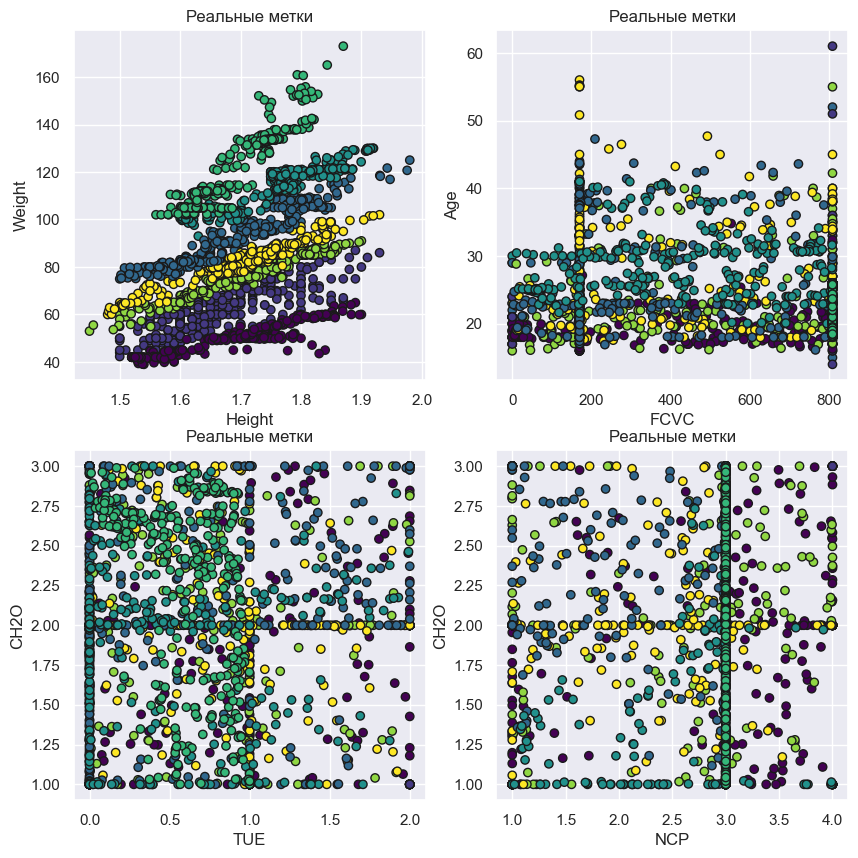

In [399]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
# График с реальными метками
axes[0, 0].scatter(X['Height'], X['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0, 0].set_title('Реальные метки')
axes[0, 0].set_xlabel('Height')
axes[0, 0].set_ylabel('Weight')


axes[0, 1].scatter(X['FCVC'], X['Age'], c=y, cmap='viridis', edgecolors='k')
axes[0, 1].set_title('Реальные метки')
axes[0, 1].set_xlabel('FCVC')
axes[0, 1].set_ylabel('Age')


axes[1, 0].scatter(X['TUE'], X['CH2O'], c=y, cmap='viridis', edgecolors='k')
axes[1, 0].set_title('Реальные метки')
axes[1, 0].set_xlabel('TUE')
axes[1, 0].set_ylabel('CH2O')

axes[1, 1].scatter(X['NCP'], X['CH2O'], c=y, cmap='viridis', edgecolors='k')
axes[1, 1].set_title('Реальные метки')
axes[1, 1].set_xlabel('NCP')
axes[1, 1].set_ylabel('CH2O')




# Кластеризация до нормализации

## Кластеризуем по всем атрибутам

In [400]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_



/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


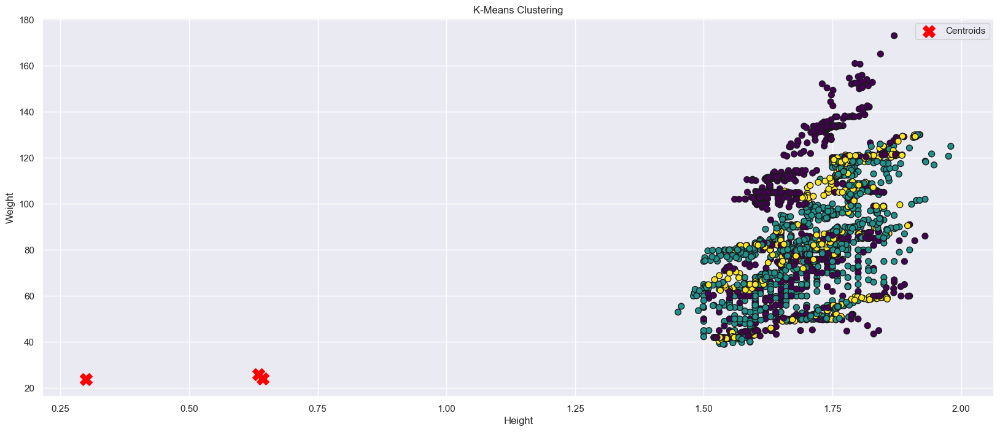

In [401]:
# Визуализация результатов
plt.scatter(X['Height'], X['Weight'], c=labels, cmap='viridis', edgecolors='k', s=50)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title('K-Means Clustering')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.legend()
plt.show()

/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


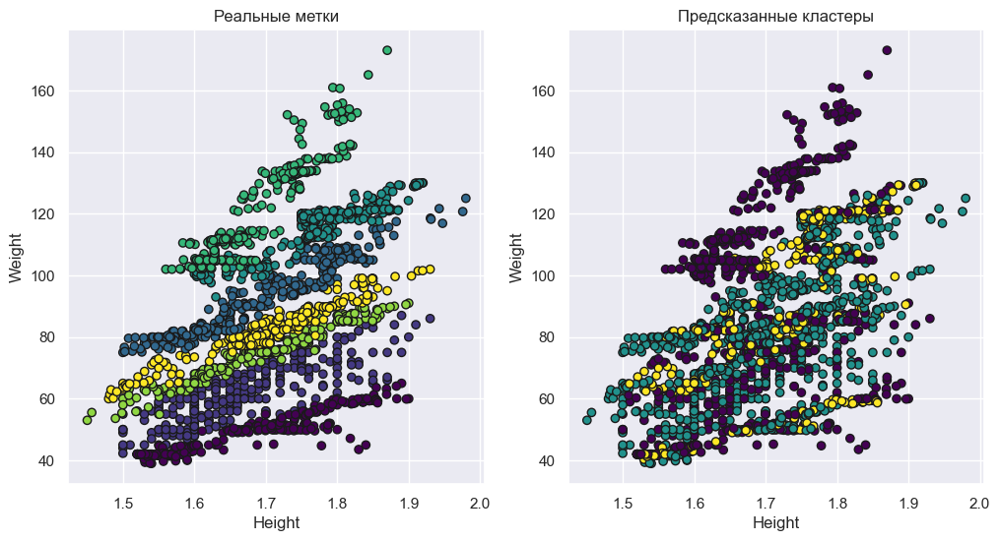

In [402]:
predicted_labels = kmeans.fit_predict(X)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X['Height'], X['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X['Height'], X['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [403]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


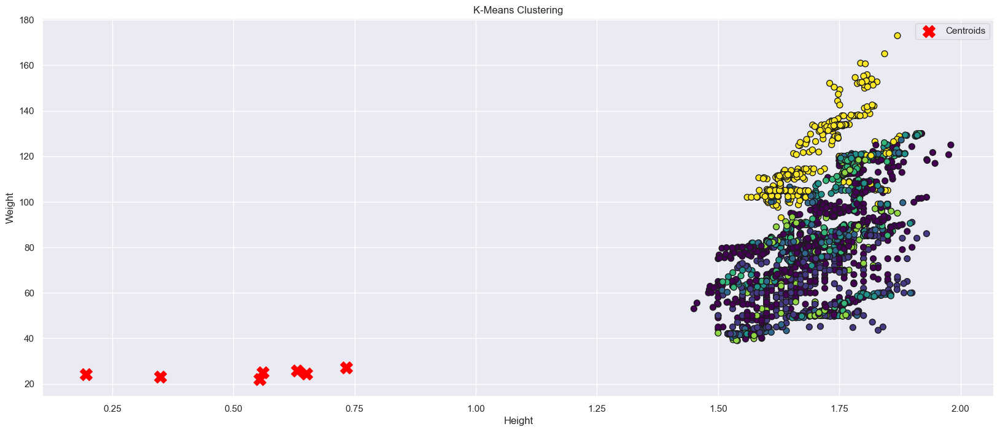

In [404]:
# Визуализация результатов
plt.scatter(X['Height'], X['Weight'], c=labels, cmap='viridis', edgecolors='k', s=50)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
plt.title('K-Means Clustering')
plt.xlabel('Height')
plt.ylabel('Weight')
plt.legend()
plt.show()

/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


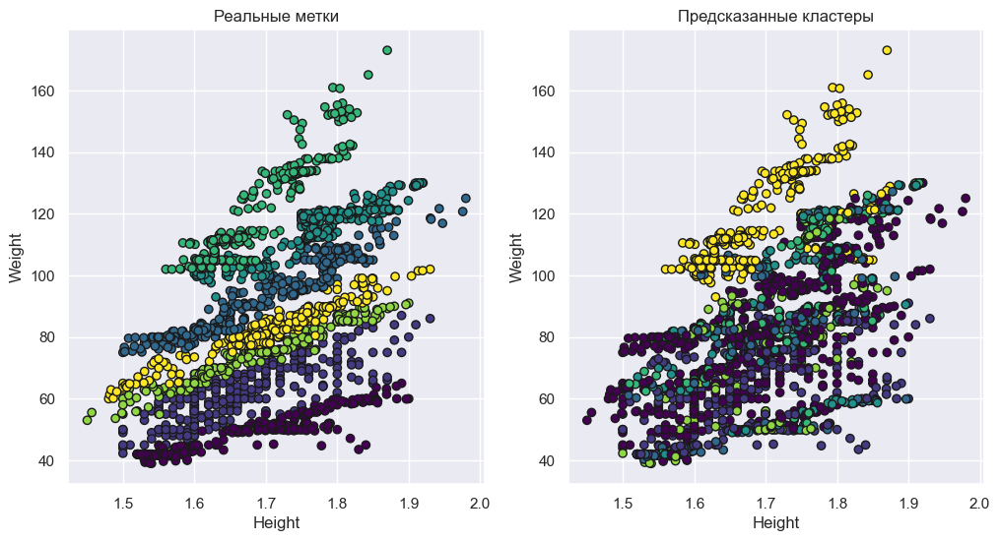

In [405]:
predicted_labels = kmeans.fit_predict(X)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X['Height'], X['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X['Height'], X['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
# axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

## Кластеризуем ТОЛЬКО по росту и весу

In [406]:
X_piece = X[['Height', 'Weight']]
X_piece

,Height,Weight
0,1.620000,64.000000
1,1.520000,56.000000
2,1.800000,77.000000
3,1.800000,87.000000
4,1.780000,89.800000
5,1.620000,53.000000
6,1.500000,55.000000
7,1.640000,53.000000
8,1.780000,64.000000
9,1.720000,68.000000


In [407]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


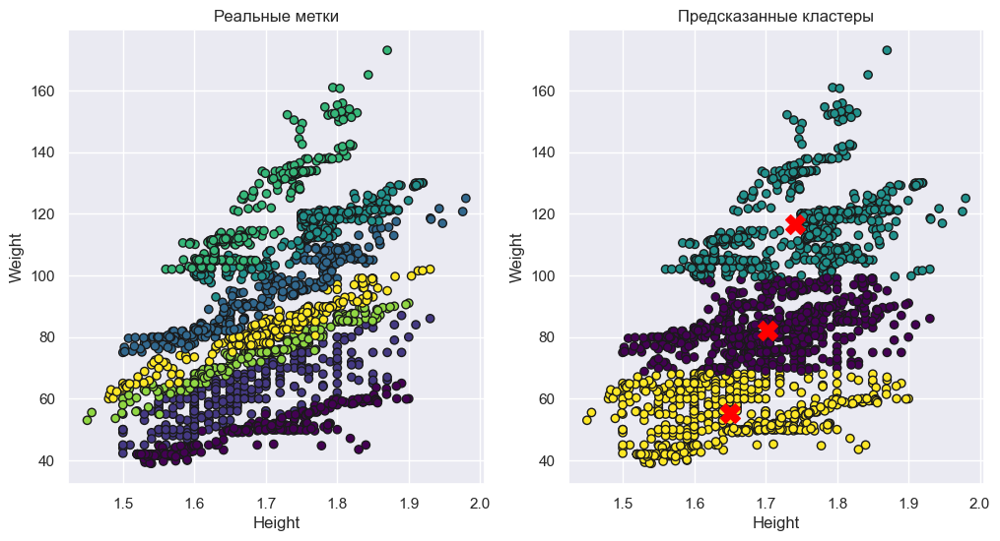

In [408]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [409]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


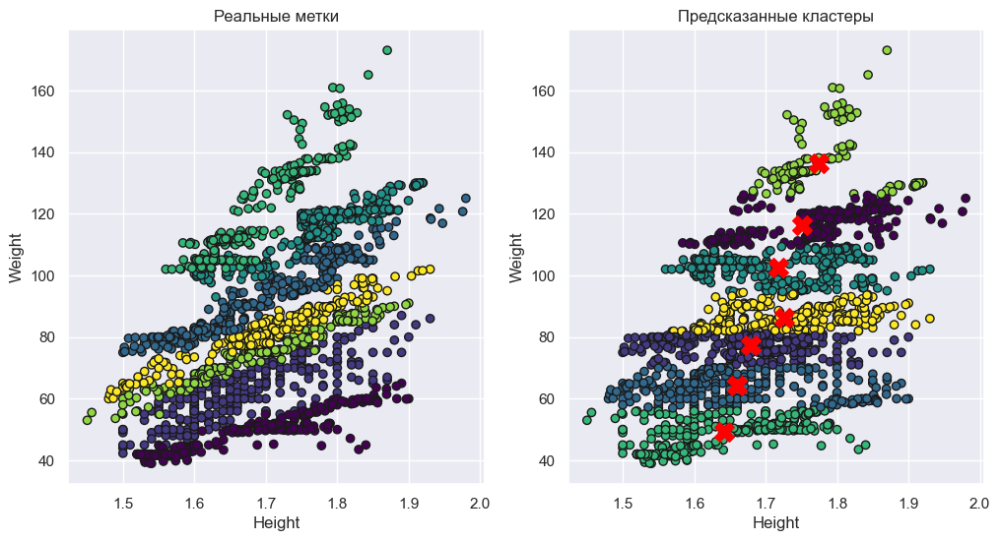

In [410]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [411]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, init='k-means++')
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_

/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


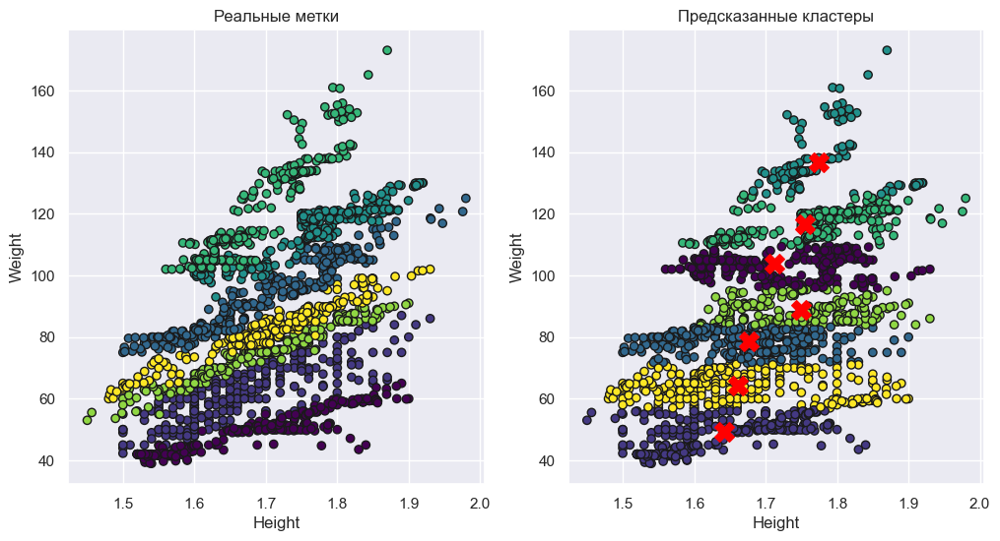

In [412]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

## Кластеризуем по важным атрибутам

In [413]:
X_piece = X[['Height', 'Weight', 'CAEC', 'Gender', 'Age']]
X_piece

,Height,Weight,CAEC,Gender,Age
0,1.620000,64.000000,2,0,21.000000
1,1.520000,56.000000,2,0,21.000000
2,1.800000,77.000000,2,1,23.000000
3,1.800000,87.000000,2,1,27.000000
4,1.780000,89.800000,2,1,22.000000
5,1.620000,53.000000,2,1,29.000000
6,1.500000,55.000000,2,0,23.000000
7,1.640000,53.000000,2,1,22.000000
8,1.780000,64.000000,2,1,24.000000
9,1.720000,68.000000,2,1,22.000000


In [414]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_



/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


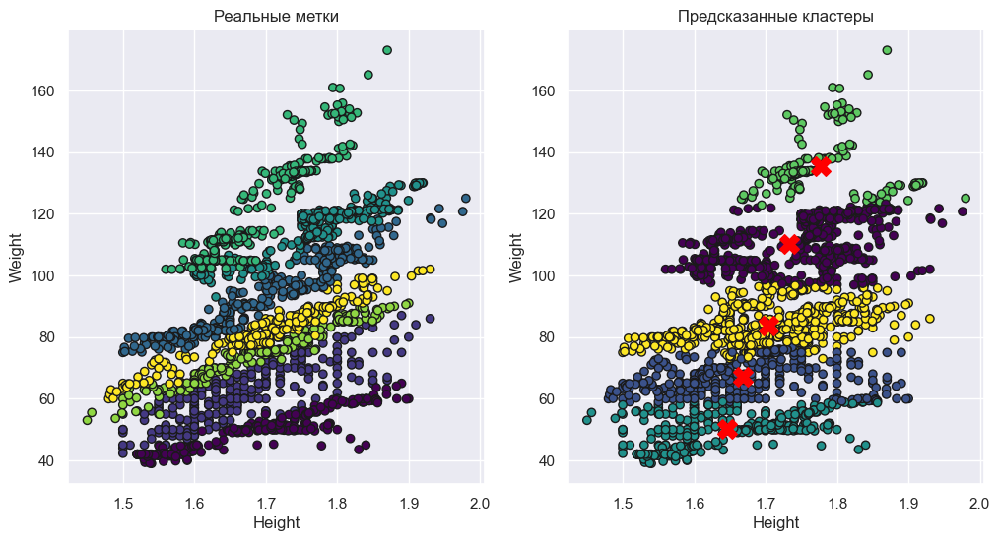

In [415]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [416]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


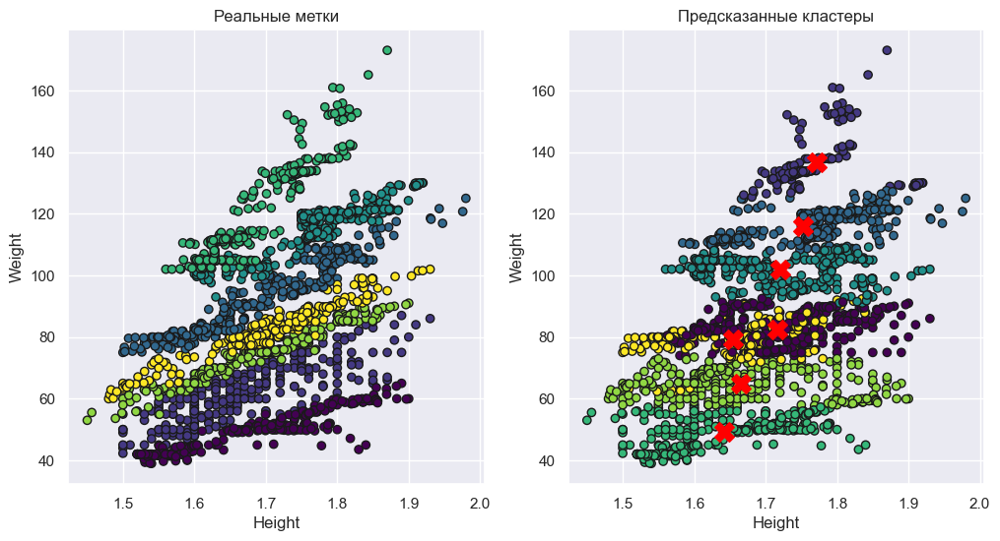

In [417]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

# Нормализация

In [418]:
normalized_X = X
scaler = StandardScaler()

normalized_X = scaler.fit_transform(normalized_X)
normalized_X = pd.DataFrame(normalized_X, columns = X.columns )
normalized_X


,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,-1.011914,-0.522124,-0.875589,-0.862558,0.472291,-2.759769,-0.975708,0.404153,0.300346,-0.145900,-0.013073,-0.218272,-1.188039,0.561997,1.419172,0.503337
1,-1.011914,-0.522124,-1.947599,-1.168077,0.472291,-2.759769,1.189244,0.404153,0.300346,6.853997,1.618759,4.581439,2.339750,-1.080625,-0.521160,0.503337
2,0.988227,-0.206889,1.054029,-0.366090,0.472291,-2.759769,-0.975708,0.404153,0.300346,-0.145900,-0.013073,-0.218272,1.163820,0.561997,-2.461491,0.503337
3,0.988227,0.423582,1.054029,0.015808,-2.117337,-2.759769,1.189244,0.404153,0.300346,-0.145900,-0.013073,-0.218272,1.163820,-1.080625,-2.461491,1.296280
4,0.988227,-0.364507,0.839627,0.122740,-2.117337,-2.759769,-0.975708,-2.167023,0.300346,-0.145900,-0.013073,-0.218272,-1.188039,-1.080625,-0.521160,0.503337
5,0.988227,0.738817,-0.875589,-1.282647,-2.117337,0.362349,-0.975708,0.404153,0.300346,-0.145900,-0.013073,-0.218272,-1.188039,-1.080625,-0.521160,-1.875493
6,-1.011914,-0.206889,-2.162001,-1.206267,0.472291,0.362349,1.189244,0.404153,0.300346,-0.145900,-0.013073,-0.218272,-0.012109,-1.080625,-0.521160,-0.289606
7,0.988227,-0.364507,-0.661187,-1.282647,-2.117337,-2.759769,-0.975708,0.404153,0.300346,-0.145900,-0.013073,-0.218272,2.339750,-1.080625,-0.521160,0.503337
8,0.988227,-0.049271,0.839627,-0.862558,0.472291,0.362349,1.189244,0.404153,0.300346,-0.145900,-0.013073,-0.218272,-0.012109,0.561997,-2.461491,0.503337
9,0.988227,-0.364507,0.196421,-0.709799,0.472291,0.362349,-0.975708,0.404153,0.300346,-0.145900,-0.013073,-0.218272,-0.012109,0.561997,1.419172,0.503337


In [419]:
normalized_mm_X = X
scaler = MinMaxScaler()

normalized_mm_X = scaler.fit_transform(normalized_mm_X)
normalized_mm_X = pd.DataFrame(normalized_mm_X, columns = X.columns )
normalized_mm_X


,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
0,0.0,0.148936,0.320755,0.186567,1.0,0.0,0.210136,0.666667,0.666667,0.0,0.500000,0.0,0.000000,0.500000,1.000000,0.75
1,0.0,0.148936,0.132075,0.126866,1.0,0.0,1.000000,0.666667,0.666667,1.0,1.000000,1.0,1.000000,0.000000,0.666667,0.75
2,1.0,0.191489,0.660377,0.283582,1.0,0.0,0.210136,0.666667,0.666667,0.0,0.500000,0.0,0.666667,0.500000,0.333333,0.75
3,1.0,0.276596,0.660377,0.358209,0.0,0.0,1.000000,0.666667,0.666667,0.0,0.500000,0.0,0.666667,0.000000,0.333333,1.00
4,1.0,0.170213,0.622642,0.379104,0.0,0.0,0.210136,0.000000,0.666667,0.0,0.500000,0.0,0.000000,0.000000,0.666667,0.75
5,1.0,0.319149,0.320755,0.104478,0.0,1.0,0.210136,0.666667,0.666667,0.0,0.500000,0.0,0.000000,0.000000,0.666667,0.00
6,0.0,0.191489,0.094340,0.119403,1.0,1.0,1.000000,0.666667,0.666667,0.0,0.500000,0.0,0.333333,0.000000,0.666667,0.50
7,1.0,0.170213,0.358491,0.104478,0.0,0.0,0.210136,0.666667,0.666667,0.0,0.500000,0.0,1.000000,0.000000,0.666667,0.75
8,1.0,0.212766,0.622642,0.186567,1.0,1.0,1.000000,0.666667,0.666667,0.0,0.500000,0.0,0.333333,0.500000,0.333333,0.75
9,1.0,0.170213,0.509434,0.216418,1.0,1.0,0.210136,0.666667,0.666667,0.0,0.500000,0.0,0.333333,0.500000,1.000000,0.75


# Кластеризация после стандартизации

## По всем атрибутам

In [420]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(normalized_X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


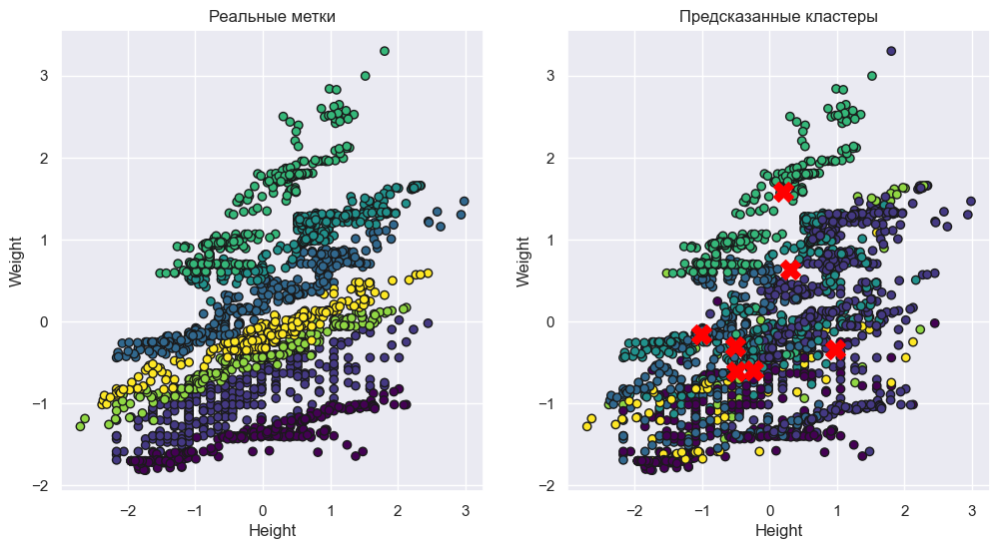

In [421]:
predicted_labels = kmeans.fit_predict(normalized_X)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(normalized_X['Height'], normalized_X['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(normalized_X['Height'], normalized_X['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [422]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(normalized_mm_X)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


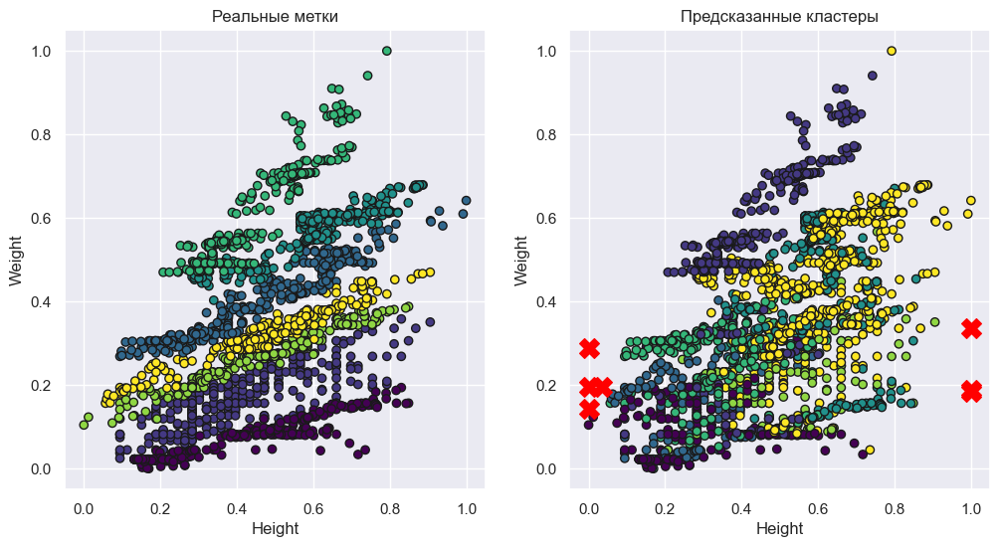

In [423]:
predicted_labels = kmeans.fit_predict(normalized_mm_X)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(normalized_mm_X['Height'], normalized_mm_X['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(normalized_mm_X['Height'], normalized_mm_X['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

## Кластеризуем ТОЛЬКО по росту и весу


In [424]:
X_piece = normalized_X[['Height', 'Weight']]
X_piece

,Height,Weight
0,-0.875589,-0.862558
1,-1.947599,-1.168077
2,1.054029,-0.366090
3,1.054029,0.015808
4,0.839627,0.122740
5,-0.875589,-1.282647
6,-2.162001,-1.206267
7,-0.661187,-1.282647
8,0.839627,-0.862558
9,0.196421,-0.709799


In [425]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


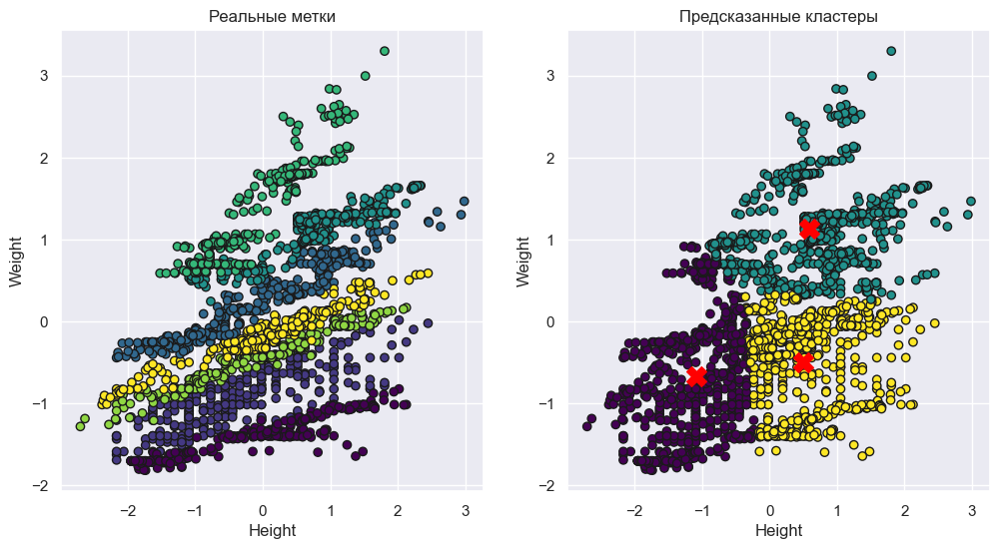

In [426]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [427]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


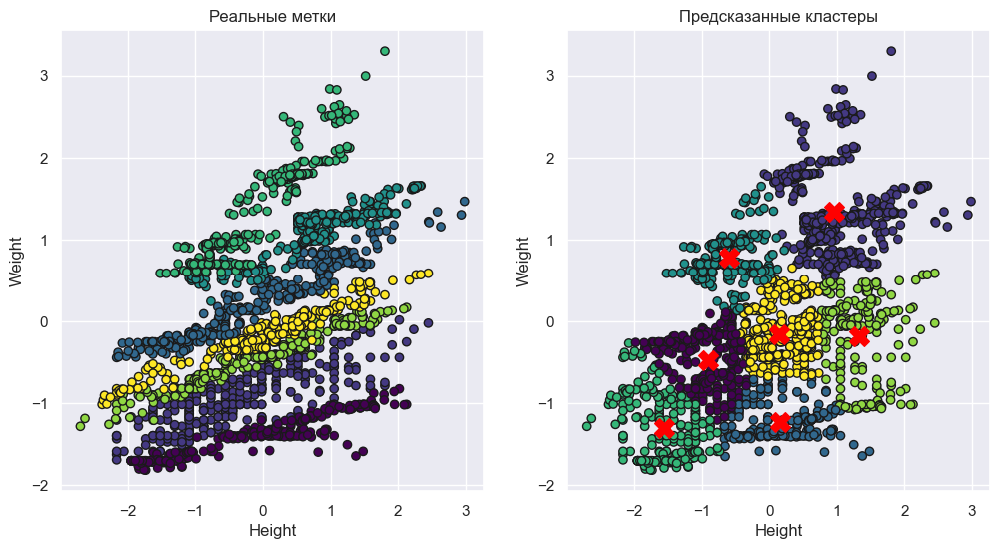

In [428]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [429]:
X_piece_mm = normalized_mm_X[['Height', 'Weight']]
X_piece_mm

,Height,Weight
0,0.320755,0.186567
1,0.132075,0.126866
2,0.660377,0.283582
3,0.660377,0.358209
4,0.622642,0.379104
5,0.320755,0.104478
6,0.094340,0.119403
7,0.358491,0.104478
8,0.622642,0.186567
9,0.509434,0.216418


In [430]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece_mm)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


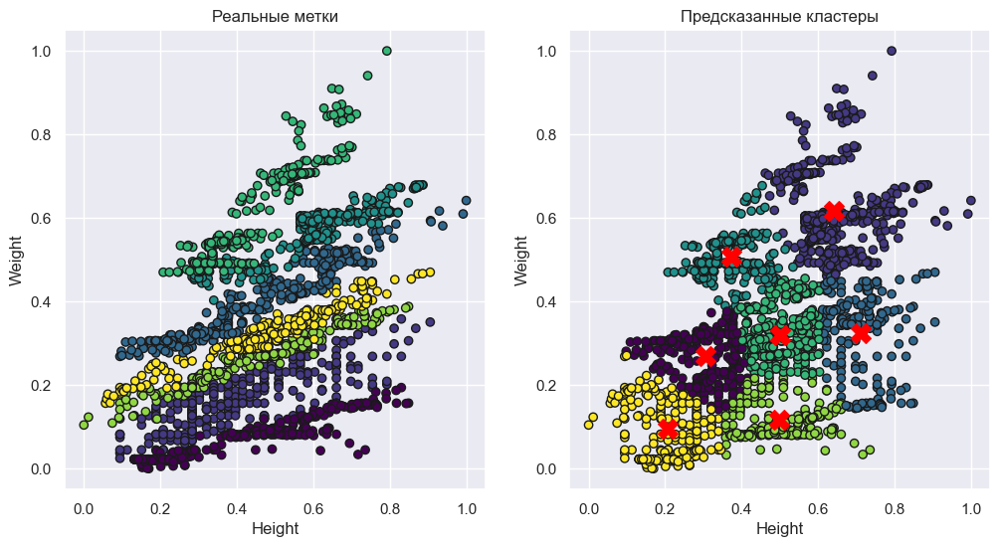

In [431]:
predicted_labels = kmeans.fit_predict(X_piece_mm)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece_mm['Height'], X_piece_mm['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece_mm['Height'], X_piece_mm['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

## Кластеризуем по важным атрибутам


In [432]:
X_piece = normalized_X[['Height', 'Weight', 'CAEC', 'Gender', 'Age']]
X_piece

,Height,Weight,CAEC,Gender,Age
0,-0.875589,-0.862558,0.300346,-1.011914,-0.522124
1,-1.947599,-1.168077,0.300346,-1.011914,-0.522124
2,1.054029,-0.366090,0.300346,0.988227,-0.206889
3,1.054029,0.015808,0.300346,0.988227,0.423582
4,0.839627,0.122740,0.300346,0.988227,-0.364507
5,-0.875589,-1.282647,0.300346,0.988227,0.738817
6,-2.162001,-1.206267,0.300346,-1.011914,-0.206889
7,-0.661187,-1.282647,0.300346,0.988227,-0.364507
8,0.839627,-0.862558,0.300346,0.988227,-0.049271
9,0.196421,-0.709799,0.300346,0.988227,-0.364507


In [433]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


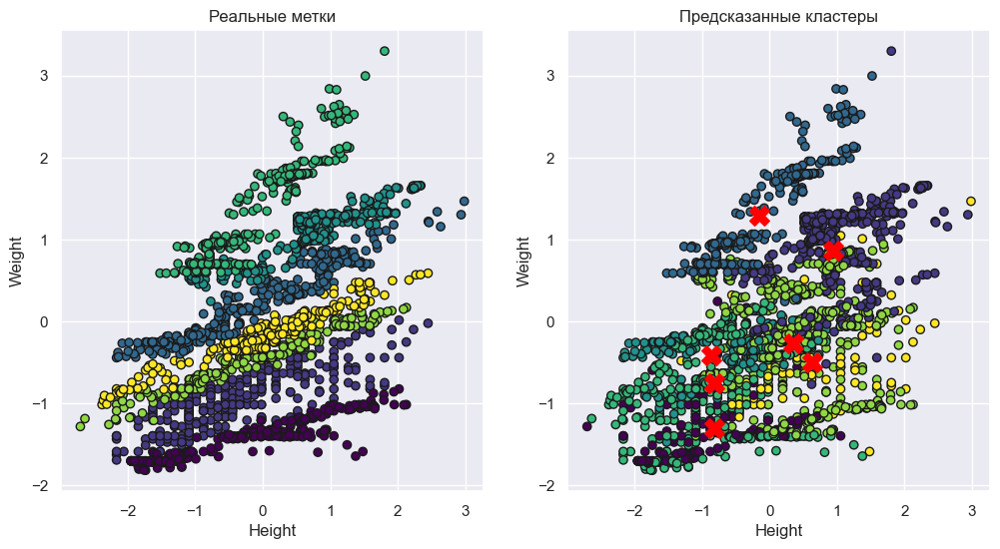

In [434]:
predicted_labels = kmeans.fit_predict(X_piece)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece['Height'], X_piece['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece['Height'], X_piece['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()

In [435]:
X_piece_mm = normalized_mm_X[['Height', 'Weight', 'CAEC', 'Gender', 'Age']]
X_piece_mm

,Height,Weight,CAEC,Gender,Age
0,0.320755,0.186567,0.666667,0.0,0.148936
1,0.132075,0.126866,0.666667,0.0,0.148936
2,0.660377,0.283582,0.666667,1.0,0.191489
3,0.660377,0.358209,0.666667,1.0,0.276596
4,0.622642,0.379104,0.666667,1.0,0.170213
5,0.320755,0.104478,0.666667,1.0,0.319149
6,0.094340,0.119403,0.666667,0.0,0.191489
7,0.358491,0.104478,0.666667,1.0,0.170213
8,0.622642,0.186567,0.666667,1.0,0.212766
9,0.509434,0.216418,0.666667,1.0,0.170213


In [436]:
# Использование KMeans для кластеризации
kmeans = KMeans(n_clusters=7, random_state=42)
kmeans.fit(X_piece_mm)
labels = kmeans.labels_
centroids = kmeans.cluster_centers_


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


/Users/khumachbayramova/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


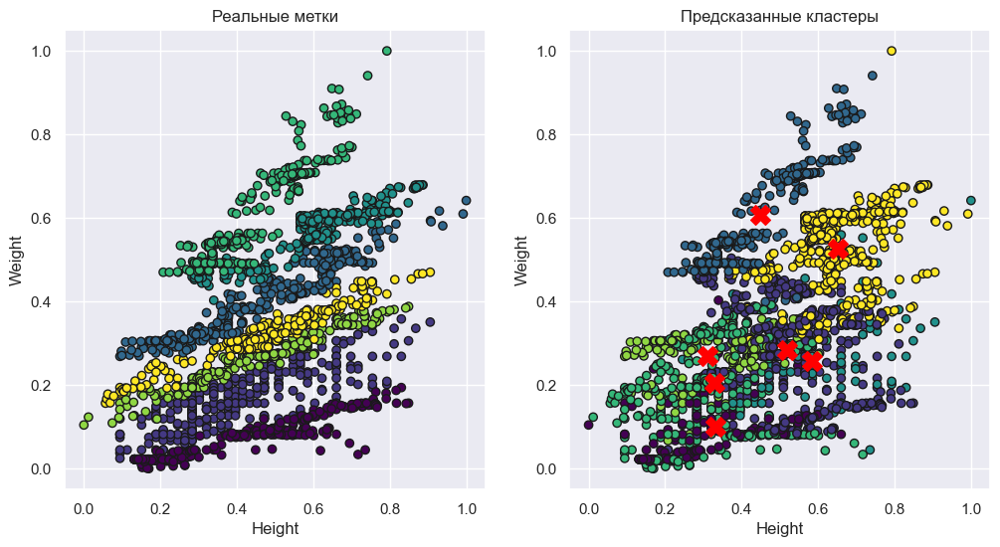

In [437]:
predicted_labels = kmeans.fit_predict(X_piece_mm)

# Создаем отдельные графики для визуализации
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# График с реальными метками
axes[0].scatter(X_piece_mm['Height'], X_piece_mm['Weight'], c=y, cmap='viridis', edgecolors='k')
axes[0].set_title('Реальные метки')
axes[0].set_xlabel('Height')
axes[0].set_ylabel('Weight')

# График с предсказанными кластерами
axes[1].scatter(X_piece_mm['Height'], X_piece_mm['Weight'], c=predicted_labels, cmap='viridis', edgecolors='k')
axes[1].scatter(centroids[:, 0], centroids[:, 1], c='red', marker='X', s=200, label='Centroids')
axes[1].set_title('Предсказанные кластеры')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Weight')

plt.show()